In [1]:
# use codex_analysis conda environment
import scanpy as sc
import pandas as pd
import os
import scanpy.external as sce
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import sys
import seaborn as sns
import collections
sys.path.append('P:\\Projects\\Anogenital_p30\\Josh_codex\\cell_exports')
import codex_functions


In [2]:
data_dir = 'P:\\Projects\\Anogenital_p30\\Josh_codex\\cell_exports'

In [6]:
meta_df = pd.read_csv(data_dir + "\\codex_meta2.csv", index_col=0)
exprs_df = pd.read_csv(data_dir + "\\codex_clamped2.csv", index_col=0)
log_df = pd.read_csv(data_dir + "\\codex_log2.csv", index_col=0)
scale_df = pd.read_csv(data_dir + "\\codex_scaled2.csv", index_col=0)

In [7]:
adata = sc.AnnData(exprs_df) # first layer is clamped data (0.01 and 0.99 tile cutoffs)

In [8]:
# adding metadata, contains information for cores, cell centers, nucleus area, circularity, etc.
for col in meta_df.columns.tolist():
    adata.obs[col] = meta_df[col]

In [9]:
adata.layers['log_data'] = log_df
adata.layers['scale_data'] = scale_df

In [14]:
potential_features = [feature for feature in adata.var_names if "Cell" in feature and "DAPI" not in feature]
use_features = [item for item in potential_features if any(substring in item for substring in ['CK17', 'CD45', 'CD4', 'CD8',
                                                                                               'CD3e', 'SMA', 'CD14', 'CD68', 'CD31', 
                                                                                              'Pan.Cyto', 'CD44'])]
print(use_features)

['CD31_Cell_Mean', 'CD4_Cell_Mean', 'CD45_Cell_Mean', 'CD8_Cell_Mean', 'SMA_Cell_Mean', 'Pan.Cytokeratin_Cell_Mean', 'CD14_Cell_Mean', 'CD44_Cell_Mean', 'CD3e_Cell_Mean', 'CD45RO_Cell_Mean', 'CD68_Cell_Mean', 'CK17_Cell_Mean']


In [15]:
pca_features = adata.var_names.isin(use_features)
print(pca_features)

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False  True
 False False False  True False  True False False False  True  True False
 False  True False False  True False  True  True  True  True False False
 False False  True]


In [16]:
sc.tl.pca(adata, layer = 'scale_data', mask_var = pca_features)

In [17]:
len(use_features)

12

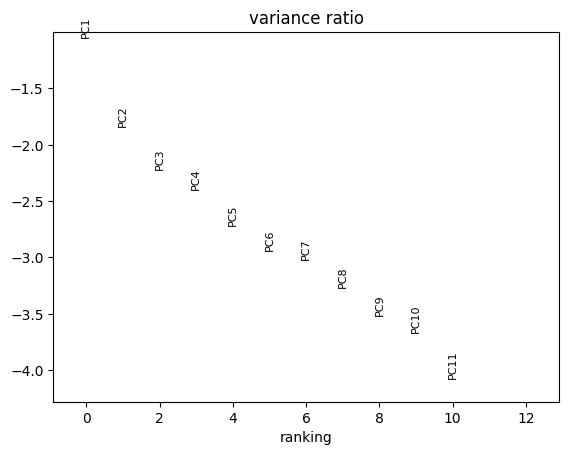

In [18]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=len(use_features))

In [19]:
sce.pp.harmony_integrate(adata, key = "core", max_iter_harmony = 20) # converge at 8

2025-02-03 16:44:34,381 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-02-03 16:45:08,579 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-02-03 16:45:11,621 - harmonypy - INFO - Iteration 1 of 20
2025-02-03 16:53:40,792 - harmonypy - INFO - Iteration 2 of 20
2025-02-03 17:02:10,471 - harmonypy - INFO - Iteration 3 of 20
2025-02-03 17:10:36,832 - harmonypy - INFO - Iteration 4 of 20
2025-02-03 17:19:00,956 - harmonypy - INFO - Iteration 5 of 20
2025-02-03 17:27:24,190 - harmonypy - INFO - Iteration 6 of 20
2025-02-03 17:35:26,854 - harmonypy - INFO - Iteration 7 of 20
2025-02-03 17:41:48,233 - harmonypy - INFO - Iteration 8 of 20
2025-02-03 17:47:22,236 - harmonypy - INFO - Iteration 9 of 20
2025-02-03 17:52:30,949 - harmonypy - INFO - Iteration 10 of 20
2025-02-03 17:56:56,219 - harmonypy - INFO - Converged after 10 iterations


In [20]:
# save out adata object
adata.write_h5ad(data_dir + "\\adata_harmony_checkpoint3.h5ad")

In [15]:
# adata = sc.read_h5ad(data_dir + "\\adata_harmony_checkpoint2.h5ad")

In [21]:
# Calculating variance ratio for harmony embeddings
harmony_variance = np.var(adata.obsm['X_pca_harmony'], axis=0)
harmony_variance_ratio = harmony_variance / np.sum(harmony_variance)

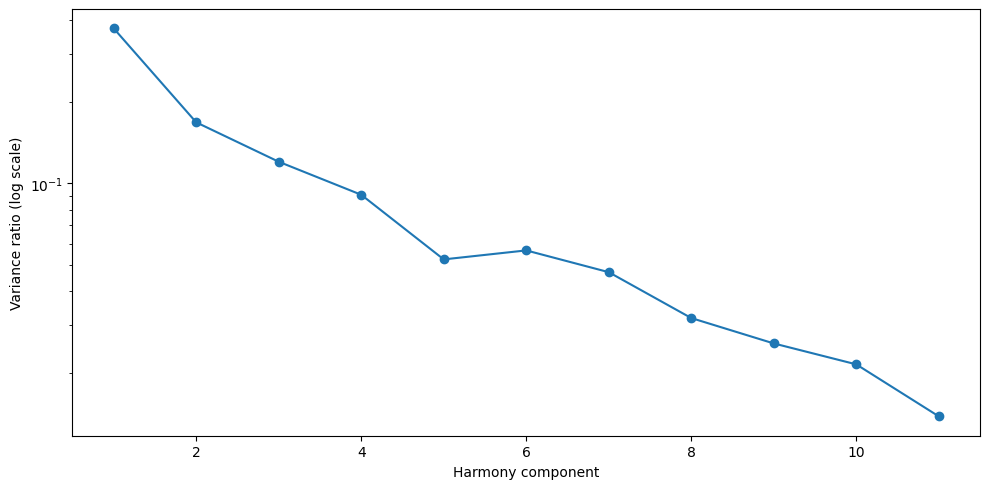

In [22]:
# plotting variance ratio, 20 selected
n_components = len(harmony_variance_ratio)
plt.figure(figsize=(10, 5))
plt.plot(range(1, n_components + 1), harmony_variance_ratio, 'o-')
plt.yscale('log')
plt.xlabel('Harmony component')
plt.ylabel('Variance ratio (log scale)')
plt.tight_layout()
plt.show()

In [23]:
sc.pp.neighbors(adata, n_neighbors = 15, n_pcs = 8, use_rep = "X_pca_harmony")

C:\Users\hdlab\miniconda3\envs\codex_analysis\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [24]:
for res in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    print(res)
    sc.tl.leiden(adata, resolution = res, key_added = f'leiden_{res}')

0.1


C:\Users\hdlab\AppData\Local\Temp\ipykernel_3336\897182273.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution = res, key_added = f'leiden_{res}')


0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0


In [3]:
# adata.write_h5ad(data_dir + "\\adata_clustering_checkpoint3.h5ad")
adata = sc.read_h5ad(data_dir + "\\adata_clustering_checkpoint3.h5ad")

In [4]:
sc.tl.umap(adata)

C:\Users\hdlab\miniconda3\envs\codex_analysis\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [10]:
# adata.write_h5ad(data_dir + "\\adata_umap_checkpoint3.h5ad")
# adata = sc.read_h5ad(data_dir + "\\adata_umap_checkpoint3.h5ad")

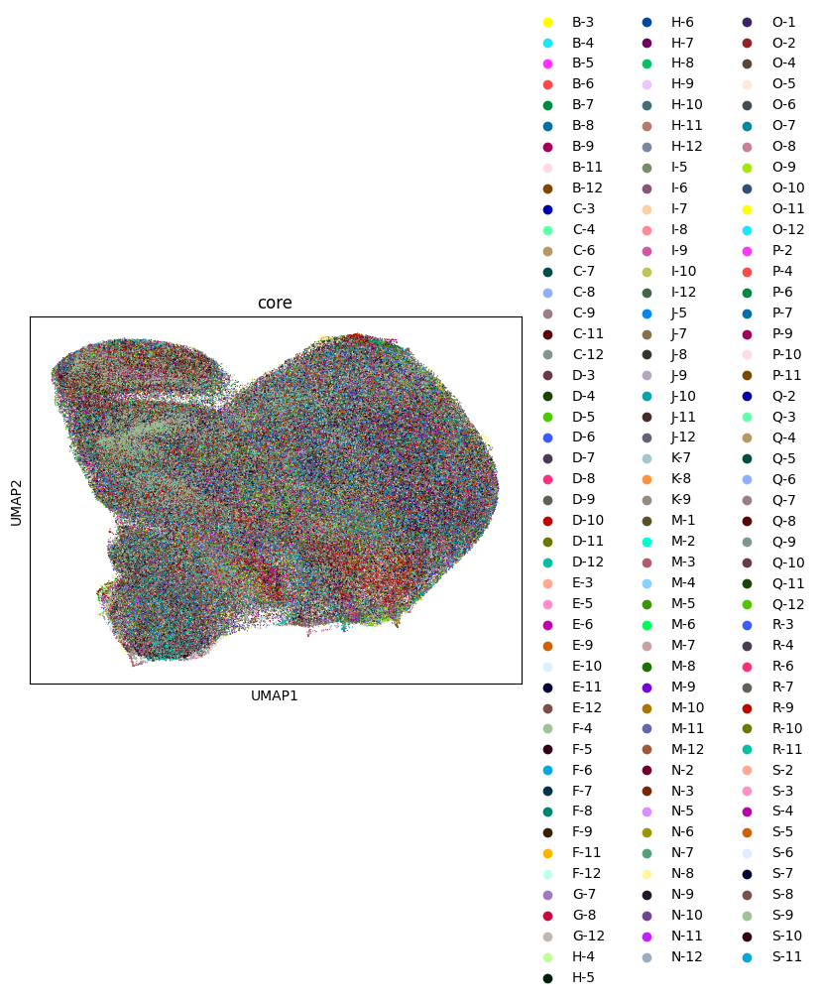

In [5]:
sc.pl.umap(adata,
           palette = sc.pl.palettes.default_102,
           color = ["core"],
           size = 3,
           ncols=2)

In [6]:
var_names = []
for gene in adata.var_names:
    if "Cell_Mean" in gene:
        var_names.append(gene)

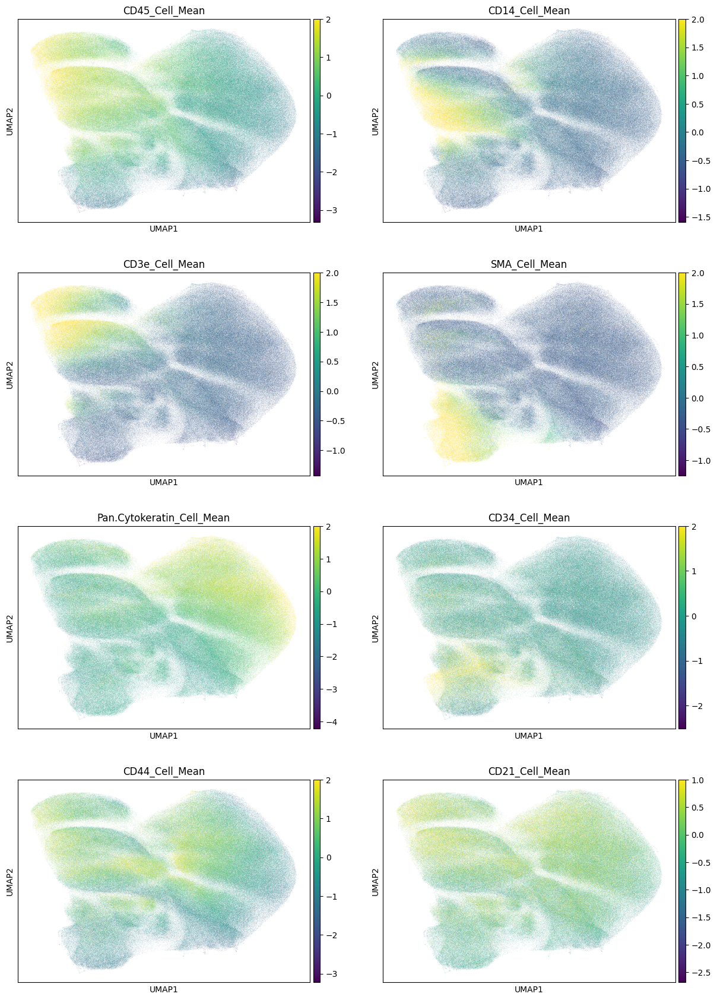

In [7]:
sc.pl.umap(adata, 
           layer="scale_data", 
           vmax =  [2, 2, 2, 2, 2, 2, 2, 1],
           color = ['CD45_Cell_Mean', 'CD14_Cell_Mean', 
                   'CD3e_Cell_Mean', 'SMA_Cell_Mean', 
                   'Pan.Cytokeratin_Cell_Mean', 'CD34_Cell_Mean', 
                   'CD44_Cell_Mean', 'CD21_Cell_Mean'],
           color_map = 'viridis',
           ncols = 2)

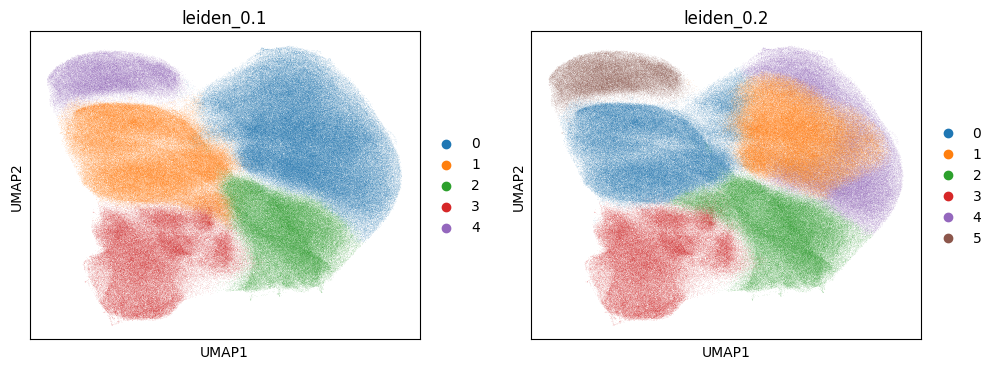

In [12]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [5, 4] # Sets the default figure size to 10x8 inches

sc.pl.umap(adata, 
           color = ["leiden_0.1", "leiden_0.2"], 
           ncols = 2)

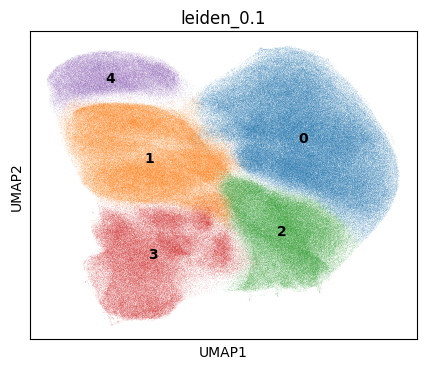

In [13]:
plt.rcParams['figure.figsize'] = [5, 4] 
sc.pl.umap(adata, 
           color = ["leiden_0.1"], 
           ncols = 1, 
           legend_loc= "on data")

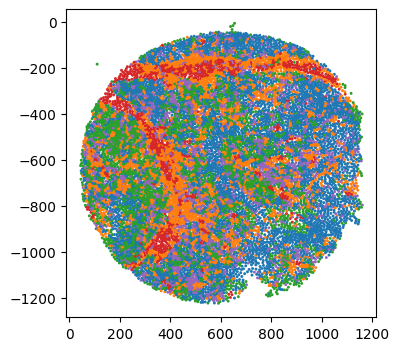

In [25]:
plt.rcParams['figure.figsize'] = [4, 4] 
plt.grid(False)
this_core = 'N-12'
clst = 'leiden_0.1'

filtered_df = adata.obs.loc[adata.obs["core"] == this_core, :]

# Get unique values
unique_labels = filtered_df[clst].unique()
n_colors = len(unique_labels)

color_dict = dict(zip(adata.obs['leiden_0.1'].cat.categories, adata.uns['leiden_0.1_colors']))
mapped = filtered_df[clst].tolist()

color_mapping = [color_dict.get(key, "gray") for key in mapped]
color_mapping

plt.scatter(x = filtered_df['Centroid.X.um'], y = -1*filtered_df['Centroid.Y.um'], c = color_mapping, s = 1.2)
plt.show()

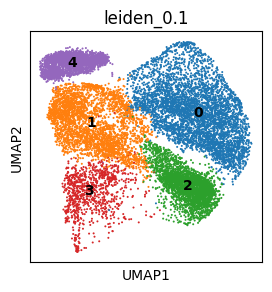

In [26]:
# Get unique values
plt.rcParams['figure.figsize'] = [3, 3] # Sets the default figure size to 10x8 inches
sc.pl.umap(adata[adata.obs['core'] == this_core], 
           color = ["leiden_0.1"],
           legend_loc = "on data",
           ncols = 2)

C:\Users\hdlab\miniconda3\envs\codex_analysis\Lib\site-packages\scanpy\tools\_dendrogram.py:193: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


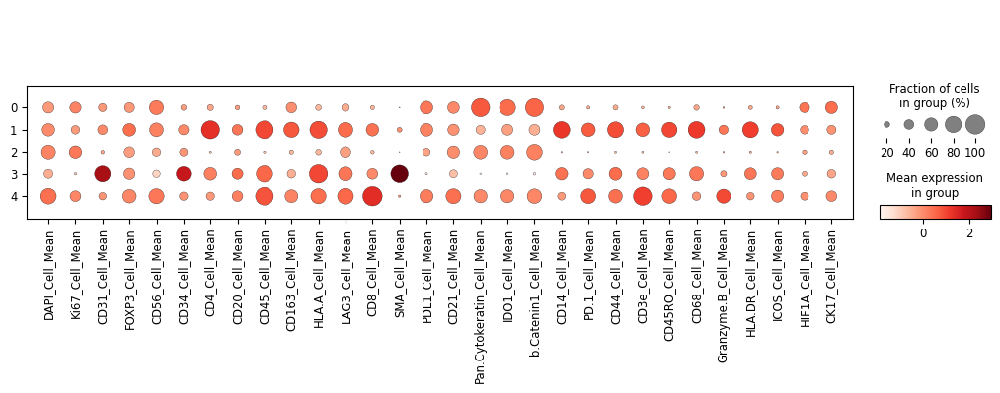

In [27]:
sc.tl.dendrogram(adata[adata.obs['core'] == this_core], groupby = "leiden_0.1",cor_method = "spearman")
sc.pl.dotplot(adata[adata.obs['core'] == this_core], var_names = var_names, groupby='leiden_0.1', layer='scale_data')

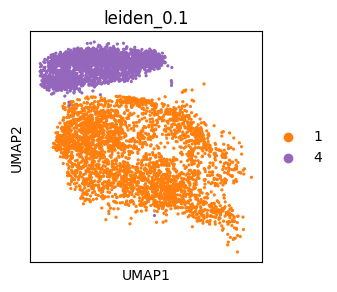

In [39]:
immune_n12 = adata[(adata.obs['leiden_0.1'].isin(['1', '4'])) & (adata.obs['core'] == 'N-12'), :]
sc.pl.umap(immune_n12, color = 'leiden_0.1')

immune = adata[adata.obs['leiden_0.1'].isin(['1', '4']), :]


In [40]:
# data needs to be rescaled at per core level for each 
og_scale = immune.layers["scale_data"] # to conirm changes after rescaling
log_norm = immune.layers["log_data"]

log_df = pd.DataFrame(log_norm).assign(core = immune.obs["core"].tolist())

# Get a list of all numeric columns, excluding the grouping column
numeric_columns = log_df.select_dtypes(include=[np.number]).columns.tolist()
numeric_columns = [col for col in numeric_columns if col != 'core']

print(numeric_columns)

# Define a function to calculate z-scores
def zscore(group):
    return (group - group.mean()) / group.std()

# Apply z-score normalization to each numeric column within each group
df_zscore = log_df.groupby('core')[numeric_columns].transform(zscore)

# Add the grouping column back to the result
df_zscore['core'] = log_df['core']


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]


C:\Users\hdlab\AppData\Local\Temp\ipykernel_54584\925542716.py:1: ImplicitModificationWarning: Setting element `.layers['scale_data']` of view, initializing view as actual.
  immune.layers["scale_data"] = np.array(df_zscore.iloc[:, :87])


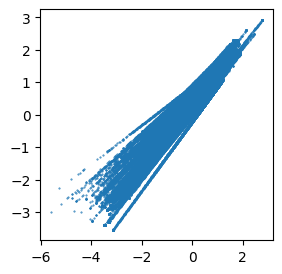

In [41]:
immune.layers["scale_data"] = np.array(df_zscore.iloc[:, :87])
plt.scatter(immune.layers["scale_data"].T[0], og_scale.T[0], s = 0.2) # per core scaling


In [90]:
immune.var_names

Index(['DAPI_Nucleus_Mean', 'Ki67_Nucleus_Mean', 'FOXP3_Nucleus_Mean',
       'CD31_Cytoplasm_Mean', 'CD56_Cytoplasm_Mean', 'CD34_Cytoplasm_Mean',
       'CD4_Cytoplasm_Mean', 'CD20_Cytoplasm_Mean', 'CD45_Cytoplasm_Mean',
       'CD163_Cytoplasm_Mean', 'HLA.A_Cytoplasm_Mean', 'LAG3_Cytoplasm_Mean',
       'CD8_Cytoplasm_Mean', 'SMA_Cytoplasm_Mean', 'PDL1_Cytoplasm_Mean',
       'CD21_Cytoplasm_Mean', 'Pan.Cytokeratin_Cytoplasm_Mean',
       'IDO1_Cytoplasm_Mean', 'b.Catenin1_Cytoplasm_Mean',
       'CD14_Cytoplasm_Mean', 'PD.1_Cytoplasm_Mean', 'CD44_Cytoplasm_Mean',
       'CD3e_Cytoplasm_Mean', 'CD45RO_Cytoplasm_Mean', 'CD68_Cytoplasm_Mean',
       'Granzyme.B_Cytoplasm_Mean', 'HLA.DR_Cytoplasm_Mean',
       'ICOS_Cytoplasm_Mean', 'HIF1A_Cytoplasm_Mean', 'CK17_Cytoplasm_Mean',
       'CD31_Membrane_Mean', 'CD56_Membrane_Mean', 'CD34_Membrane_Mean',
       'CD4_Membrane_Mean', 'CD20_Membrane_Mean', 'CD45_Membrane_Mean',
       'CD163_Membrane_Mean', 'HLA.A_Membrane_Mean', 'LAG3_Membran

In [43]:
def find_strings_with_substrings(main_list, include_substrings, exclude_substrings):
    return [
        item for item in main_list 
        if any(include in item for include in include_substrings)
        and not any(exclude in item for exclude in exclude_substrings)
    ]

incl = ["Cell"]
excl = ["DAPI", "CD31", "CD34", "SMA", "b.Catenin", "Pan", "CK17", "CD44", 'HIF', 'Ki67', 'HLA.A', 'LAG3', 'PD', 'CD45_', 'ICOS', 'Gran','CD45']
result = find_strings_with_substrings(immune.var_names,include_substrings = incl, exclude_substrings = excl)
print(result)

pca_features = immune.var_names.isin(result)
sc.tl.pca(immune, layer = 'scale_data', mask_var = pca_features)

['FOXP3_Cell_Mean', 'CD56_Cell_Mean', 'CD4_Cell_Mean', 'CD20_Cell_Mean', 'CD163_Cell_Mean', 'CD8_Cell_Mean', 'CD21_Cell_Mean', 'IDO1_Cell_Mean', 'CD14_Cell_Mean', 'CD3e_Cell_Mean', 'CD68_Cell_Mean', 'HLA.DR_Cell_Mean']


In [44]:
sce.pp.harmony_integrate(immune, key = "core", max_iter_harmony = 20) # converge at 10

2025-02-11 12:11:17,489 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-02-11 12:11:27,597 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-02-11 12:11:28,584 - harmonypy - INFO - Iteration 1 of 20
2025-02-11 12:13:26,191 - harmonypy - INFO - Iteration 2 of 20
2025-02-11 12:15:24,012 - harmonypy - INFO - Iteration 3 of 20
2025-02-11 12:17:21,843 - harmonypy - INFO - Iteration 4 of 20
2025-02-11 12:19:19,539 - harmonypy - INFO - Iteration 5 of 20
2025-02-11 12:20:46,699 - harmonypy - INFO - Iteration 6 of 20
2025-02-11 12:22:14,149 - harmonypy - INFO - Iteration 7 of 20
2025-02-11 12:23:33,100 - harmonypy - INFO - Iteration 8 of 20
2025-02-11 12:24:48,238 - harmonypy - INFO - Iteration 9 of 20
2025-02-11 12:25:58,535 - harmonypy - INFO - Iteration 10 of 20
2025-02-11 12:27:08,805 - harmonypy - INFO - Converged after 10 iterations


In [45]:
# Calculating variance ratio for harmony embeddings
harmony_variance = np.var(immune.obsm['X_pca_harmony'], axis=0)
harmony_variance_ratio = harmony_variance / np.sum(harmony_variance)

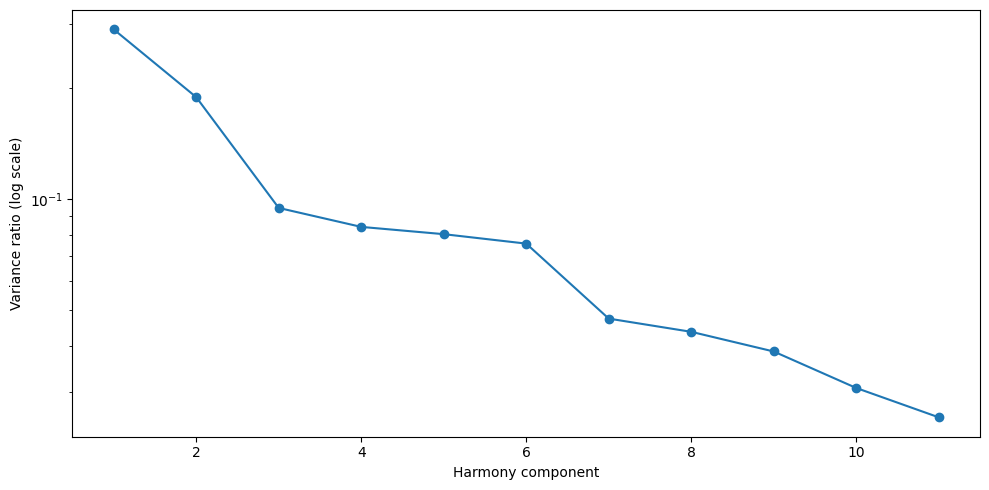

In [46]:
# plotting variance ratio, 20 selected
n_components = len(harmony_variance_ratio)
plt.figure(figsize=(10, 5))
plt.plot(range(1, n_components + 1), harmony_variance_ratio, 'o-')
plt.yscale('log')
plt.xlabel('Harmony component')
plt.ylabel('Variance ratio (log scale)')
plt.tight_layout()
plt.show()

In [47]:
sc.pp.neighbors(immune, n_neighbors = 15, n_pcs = 7, use_rep = "X_pca_harmony")

In [48]:
for res in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    print(res)
    sc.tl.leiden(immune, resolution = res, key_added = f'leiden_{res}')

0.1


C:\Users\hdlab\AppData\Local\Temp\ipykernel_54584\78716915.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(immune, resolution = res, key_added = f'leiden_{res}')


0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0


In [49]:
sc.tl.umap(immune)

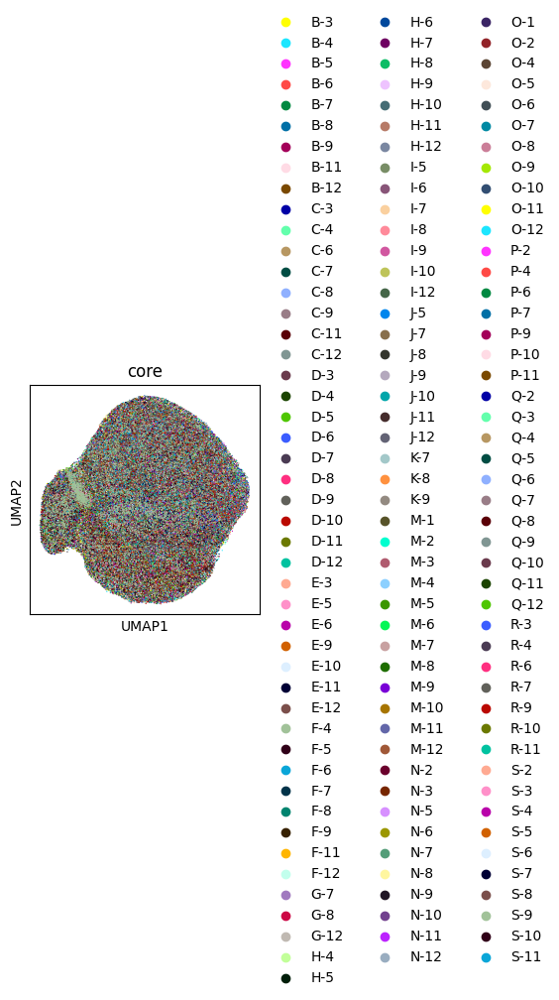

In [50]:
sc.pl.umap(immune,
           palette = sc.pl.palettes.default_102,
           color = ["core"],
           size = 3,
           ncols=2)

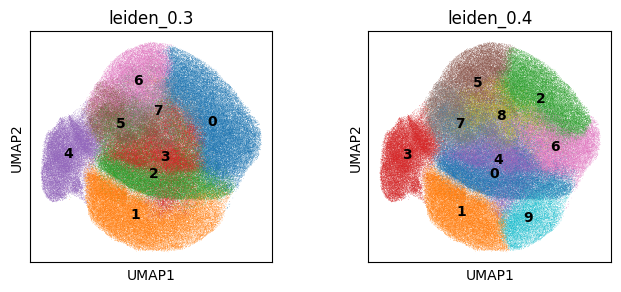

In [79]:
sc.pl.umap(immune,
           color = ["leiden_0.3", "leiden_0.4"],
           size = 0.5,
           legend_loc = 'on data',
           ncols=2)

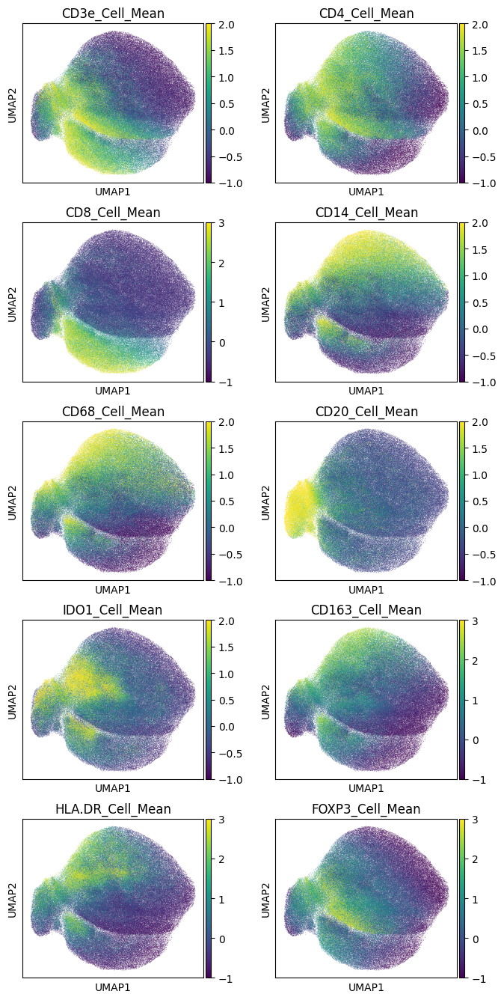

In [83]:
sc.pl.umap(immune, 
           layer= "scale_data", 
           vmax =  [2, 2, 3, 2, 2, 2, 2, 3, 3, 3],
           vmin =  [-1, -1, -1, -1, -1, -1, -1, -1, -1, -1],
           color = ["CD3e_Cell_Mean", "CD4_Cell_Mean", "CD8_Cell_Mean", 
                    "CD14_Cell_Mean", "CD68_Cell_Mean", "CD20_Cell_Mean", 
                    "IDO1_Cell_Mean", "CD163_Cell_Mean", "HLA.DR_Cell_Mean",
                   'FOXP3_Cell_Mean'], 
           ncols = 2)

In [88]:
# immune.write_h5ad(data_dir + "\\immune_umap_checkpoint3.h5ad")

In [103]:
broad_immune_dict = pd.DataFrame({'leiden_0.4': sorted(immune.obs['leiden_0.4'].unique().tolist()), 
                                  'broad_immune': ['CD4_T', 'CD8_T', 'Myeloid', 'Bcells', 'CD4_T_myl_mix',
                                                   'Myeloid', 'Myeloid', 'Myeloid', 'Myeloid', 'CD8_T']})

In [104]:
broad_immune_dict

,leiden_0.4,broad_immune
0,0,CD4_T
1,1,CD8_T
2,2,Myeloid
3,3,Bcells
4,4,CD4_T_myl_mix
5,5,Myeloid
6,6,Myeloid
7,7,Myeloid
8,8,Myeloid
9,9,CD8_T


In [112]:
broad_immune = pd.merge(immune.obs, broad_immune_dict, how = 'left', left_on = 'leiden_0.4', right_on = 'leiden_0.4')
a = broad_immune[broad_immune['core'] == 'N-12']
a.value_counts('leiden_0.4')
# broad_immune.to_csv(data_dir + '\\broad_immune_classes.csv')

leiden_0.4
1    1369
7     796
4     652
6     503
5     469
0     459
9     429
3     398
2     384
8     168
Name: count, dtype: int64

In [106]:
broad_immune[broad_immune.obs['core'] == 'N-12']

AttributeError: 'DataFrame' object has no attribute 'obs'

In [122]:
n12_only = immune[immune.obs['core'] == 'N-12']

log_norm = n12_only.layers["log_data"]
log_df = pd.DataFrame(log_norm).assign(core = n12_only.obs["core"].tolist())

# Get a list of all numeric columns, excluding the grouping column
numeric_columns = log_df.select_dtypes(include=[np.number]).columns.tolist()
numeric_columns = [col for col in numeric_columns if col != 'core']

print(numeric_columns)

# Define a function to calculate z-scores
def zscore(group):
    return (group - group.mean()) / group.std()

# Apply z-score normalization to each numeric column within each group
df_zscore = log_df.groupby('core')[numeric_columns].transform(zscore)

# Add the grouping column back to the result
df_zscore['core'] = log_df['core']

n12_only.layers["scale_data"] = np.array(df_zscore.iloc[:,:87])



[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]


C:\Users\hdlab\AppData\Local\Temp\ipykernel_54584\3879968047.py:22: ImplicitModificationWarning: Setting element `.layers['scale_data']` of view, initializing view as actual.
  n12_only.layers["scale_data"] = np.array(df_zscore.iloc[:,:87])


In [128]:
def find_strings_with_substrings(main_list, include_substrings, exclude_substrings):
    return [
        item for item in main_list 
        if any(include in item for include in include_substrings)
        and not any(exclude in item for exclude in exclude_substrings)
    ]

incl = ["Cell"]
excl = ["DAPI", "CD31", "CD34", "SMA", "b.Catenin", "Pan", "CK17", "CD44"]
result = find_strings_with_substrings(immune.var_names,include_substrings = incl, exclude_substrings = excl)
print(result)

pca_features = n12_only.var_names.isin(result)
sc.tl.pca(n12_only, layer = 'scale_data', mask_var = pca_features)

['Ki67_Cell_Mean', 'FOXP3_Cell_Mean', 'CD56_Cell_Mean', 'CD4_Cell_Mean', 'CD20_Cell_Mean', 'CD45_Cell_Mean', 'CD163_Cell_Mean', 'HLA.A_Cell_Mean', 'LAG3_Cell_Mean', 'CD8_Cell_Mean', 'PDL1_Cell_Mean', 'CD21_Cell_Mean', 'IDO1_Cell_Mean', 'CD14_Cell_Mean', 'PD.1_Cell_Mean', 'CD3e_Cell_Mean', 'CD45RO_Cell_Mean', 'CD68_Cell_Mean', 'Granzyme.B_Cell_Mean', 'HLA.DR_Cell_Mean', 'ICOS_Cell_Mean', 'HIF1A_Cell_Mean']


In [129]:
sc.pp.neighbors(n12_only, n_neighbors = 15, n_pcs = 15, use_rep = "X_pca")

In [130]:
for res in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    print(res)
    sc.tl.leiden(n12_only, resolution = res, key_added = f'leiden_{res}')

0.1
0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0


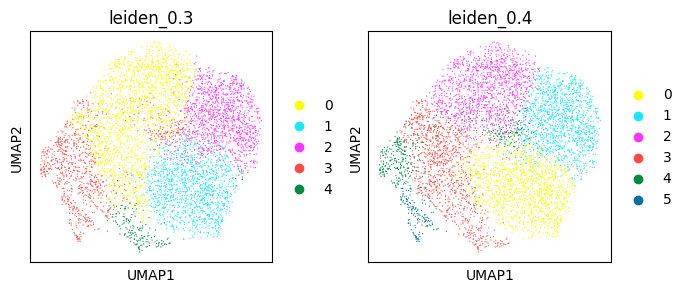

In [133]:
sc.tl.umap(n12_only)
sc.pl.umap(n12_only,
           palette = sc.pl.palettes.default_102,
           color = ["leiden_0.3", 'leiden_0.4'],
           size = 3,
           ncols=2)

In [493]:
adata.obs.columns
adata.obs = adata.obs.merge(cluster_maps, how = "left", on = 'Object.ID')

In [494]:
ix = adata.obs['clustering'].isna()

# Convert to string type
adata.obs['from'] = adata.obs['from'].astype(str)
adata.obs['clustering'] = adata.obs['clustering'].astype(str)

In [495]:
# Replace NaN values in 'clustering' column
adata.obs.loc[ix, 'clustering'] = 'og_' + df['leiden_0.4'].astype(str)

# Replace NaN values in 'from' column
adata.obs.loc[ix, 'from'] = 'og_leiden_0.4'


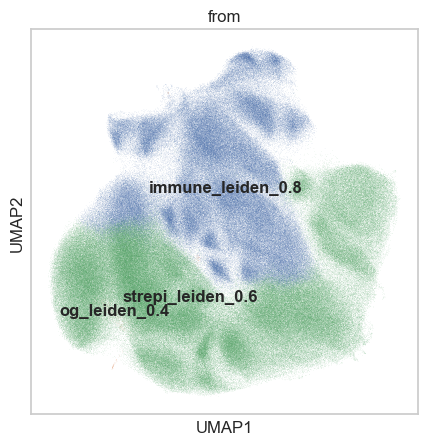

In [500]:
plt.rcParams['figure.figsize'] = [5, 5]
sc.pl.umap(adata, 
           color = ['from'],
           legend_loc = "on data",
           ncols = 2)

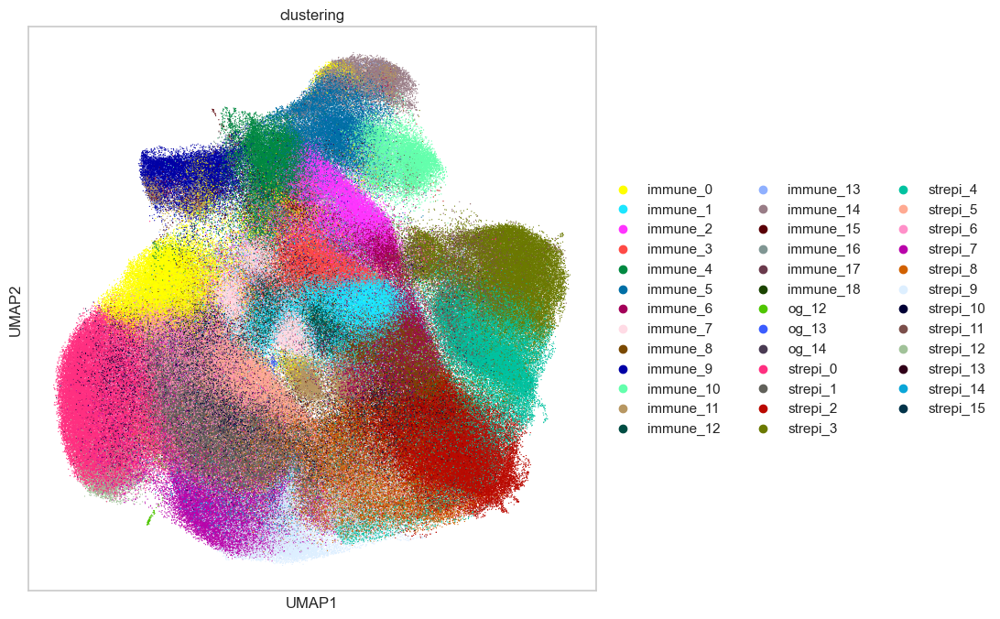

In [507]:
plt.rcParams['figure.figsize'] = [8, 8]
sc.pl.umap(adata, 
           color = ['clustering'],
           ncols = 1, size = 3)

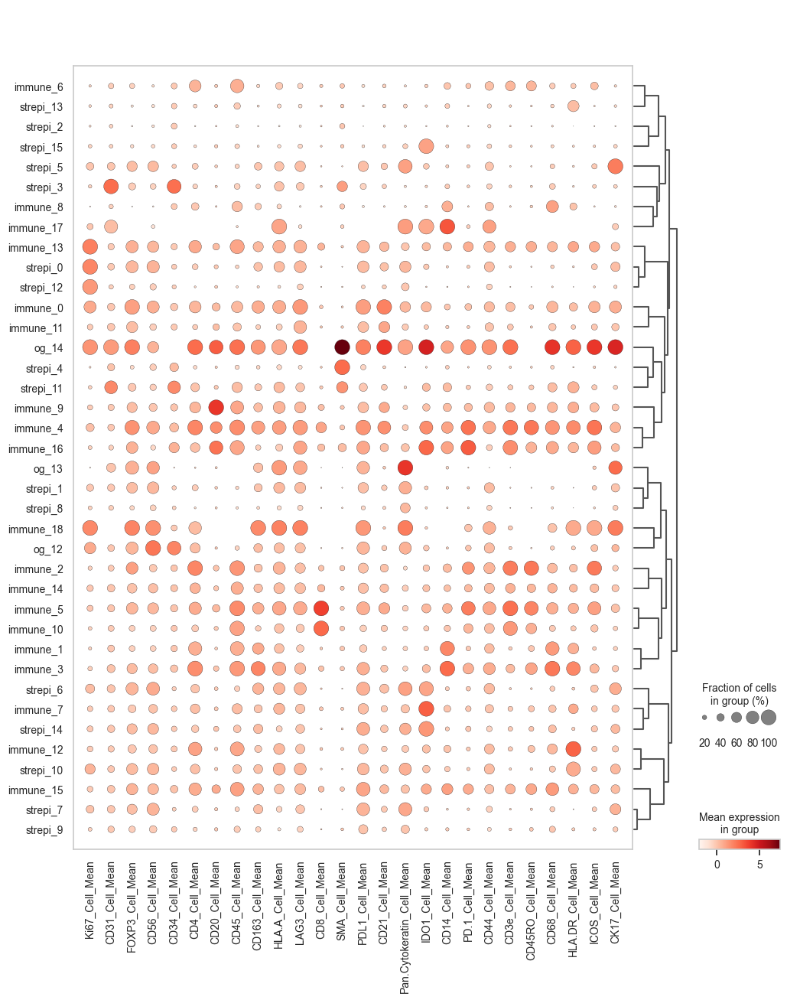

['Ki67_Cell_Mean', 'CD31_Cell_Mean', 'FOXP3_Cell_Mean', 'CD56_Cell_Mean', 'CD34_Cell_Mean', 'CD4_Cell_Mean', 'CD20_Cell_Mean', 'CD45_Cell_Mean', 'CD163_Cell_Mean', 'HLA.A_Cell_Mean', 'LAG3_Cell_Mean', 'CD8_Cell_Mean', 'SMA_Cell_Mean', 'PDL1_Cell_Mean', 'CD21_Cell_Mean', 'Pan.Cytokeratin_Cell_Mean', 'IDO1_Cell_Mean', 'CD14_Cell_Mean', 'PD.1_Cell_Mean', 'CD44_Cell_Mean', 'CD3e_Cell_Mean', 'CD45RO_Cell_Mean', 'CD68_Cell_Mean', 'HLA.DR_Cell_Mean', 'ICOS_Cell_Mean', 'CK17_Cell_Mean']


In [675]:
plot_markers = []
moi = ["CD45", "Ki67", "CD31", "FOXP3", "CD56", "CD34", "CD4", "CD20", "CD45", "CD163", "HLA.A", "LAG3",
       "SMA", "CD8", "PDL1", "CD21", "Pan.Cytokeratin", "IDO1", "b.Cetenin1", "CD14", "PD.1", "CD44", "CD3e",
       "CD45RO", "CD68", "Granzyme", "HLA.DR", "ICOS", "HIF1", "CK17"]

moi=[elem+"_Cell_Mean" for elem in moi]

plot_markers = [s for s in adata.var_names.tolist() if any(sub in s for sub in moi)]

sc.tl.dendrogram(adata = adata, groupby = 'clustering',cor_method = 'spearman')
sc.pl.dotplot(adata = adata, var_names = plot_markers, groupby = 'clustering', 
              layer = 'scale_data', use_raw = True, dendrogram = True)

In [733]:
foi = [feat for feat in adata.var_names if "Cell_Mean" in feat]
marker_masks = {marker: adata.var_names == marker for marker in foi}

exprs_df = pd.DataFrame()
marker
for marker in marker_masks.keys():
    marker_loc = marker_masks[marker]
    vals = adata.layers['log_data'][:,marker_loc].flatten()
    exprs_df[marker] = np.round(vals, 4)

coords = adata.obs[['Centroid.X.um', 'Centroid.Y.um']]

,Centroid.X.um,Centroid.Y.um
0,424.93,592.71
1,700.51,651.22
2,652.92,649.03
3,892.56,306.25
4,693.88,600.19
...,...,...
802043,634.24,408.02
802044,400.15,191.57
802045,1038.90,265.98
802046,491.86,935.12


In [735]:
# write out for statistics / plotting in R
out_df = pd.DataFrame({
'Object.ID':adata.obs['Object.ID'],
'clustering': adata.obs['clustering'], 
'from':adata.obs['from']})

fi_out_df = pd.concat([out_df, coords, exprs_df], axis = 1)

fi_out_df.to_csv("data_for_presentation.csv")


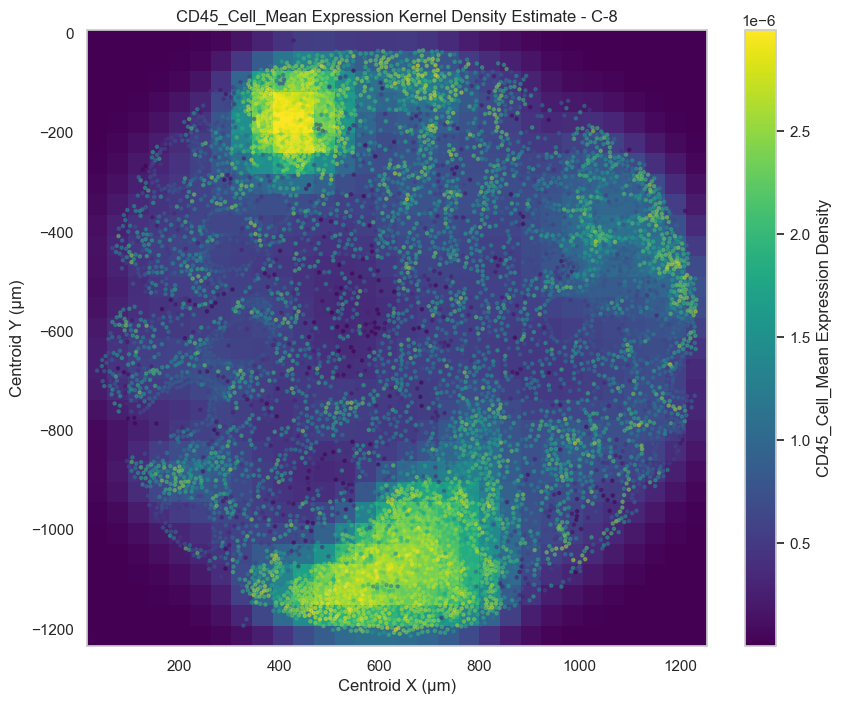

In [557]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity
import seaborn as sns

my_var = "CD45_Cell_Mean"
# Extract data for core B-12
core = 'C-8'
sset = adata[adata.obs['core'] == core]

# Get the index of CD45 in var names
feature_idx = np.where(adata.var_names == my_var)[0][0]

# Extract coordinates and expression values
x = sset.obs['Centroid.X.um'].values
y = -1*sset.obs['Centroid.Y.um'].values
exprs = sset.layers['log_data'][:, feature_idx].flatten()

# Combine coordinates
coords = np.vstack([x, y]).T

# Fit the kernel density model
kde = KernelDensity(bandwidth = 50, kernel='gaussian')
kde.fit(coords, sample_weight=exprs)

# Create a grid for density estimation
x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                             np.linspace(y.min(), y.max(), 30))
xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

# Estimate the density on the grid
z = np.exp(kde.score_samples(xy_grid))
z = z.reshape(x_grid.shape)

# Plot
plt.figure(figsize=(10, 8))
plt.pcolormesh(x_grid, y_grid, z, shading='auto', cmap='viridis')
plt.colorbar(label=f'{my_var} Expression Density')
plt.scatter(x, y, c=exprs, s=5, cmap='viridis', alpha=0.5)
plt.xlabel('Centroid X (µm)')
plt.ylabel('Centroid Y (µm)')
plt.title(f'{my_var} Expression Kernel Density Estimate - {core}')
plt.show()



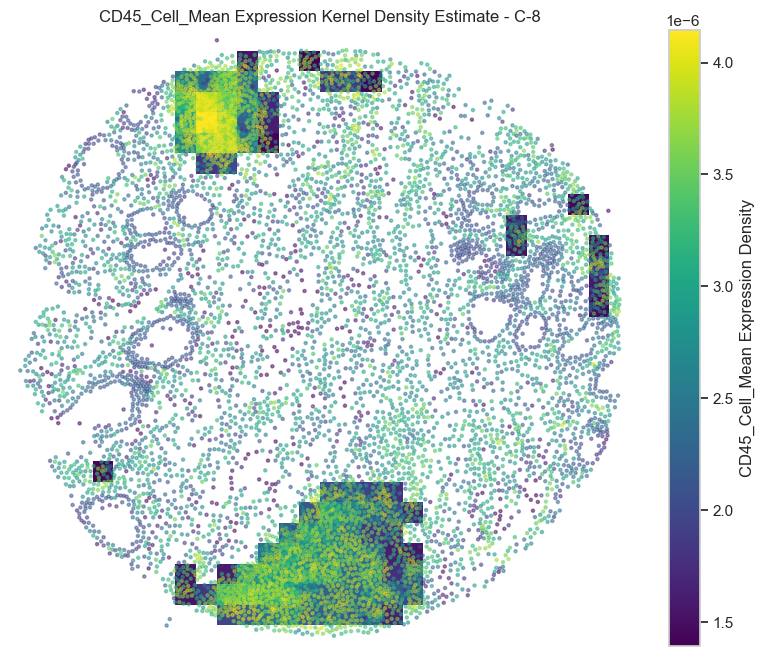

In [576]:

my_var = "CD45_Cell_Mean"
# Extract data for core B-12
core = 'C-8'
sset = adata[adata.obs['core'] == core]

# Get the index of CD45 in var names
feature_idx = np.where(adata.var_names == my_var)[0][0]

# Extract coordinates and expression values
x = sset.obs['Centroid.X.um'].values
y = -1*sset.obs['Centroid.Y.um'].values
exprs = sset.layers['log_data'][:, feature_idx].flatten()

# Combine coordinates
coords = np.vstack([x, y]).T

# Fit the kernel density model
kde = KernelDensity(bandwidth = 20, kernel='gaussian')
kde.fit(coords, sample_weight=exprs)

# Create a grid for density estimation
x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                             np.linspace(y.min(), y.max(), 30))
xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

# Estimate the density on the grid
z = np.exp(kde.score_samples(xy_grid))
z = z.reshape(x_grid.shape)

# Create a mask based on a density threshold
density_threshold = np.percentile(z, 90)  # Adjust this value to change the masking level
mask = z > density_threshold

# Plot
plt.figure(figsize=(10, 8))
plt.pcolormesh(x_grid, y_grid, np.where(mask, z, np.nan), shading='auto', cmap='viridis')
plt.colorbar(label=f'{my_var} Expression Density')
plt.scatter(x, y, c=exprs, s=5, cmap='viridis', alpha=0.5)
plt.xlabel('Centroid X (µm)')
plt.ylabel('Centroid Y (µm)')
plt.title(f'{my_var} Expression Kernel Density Estimate - {core}')
plt.axis('off')
plt.show()


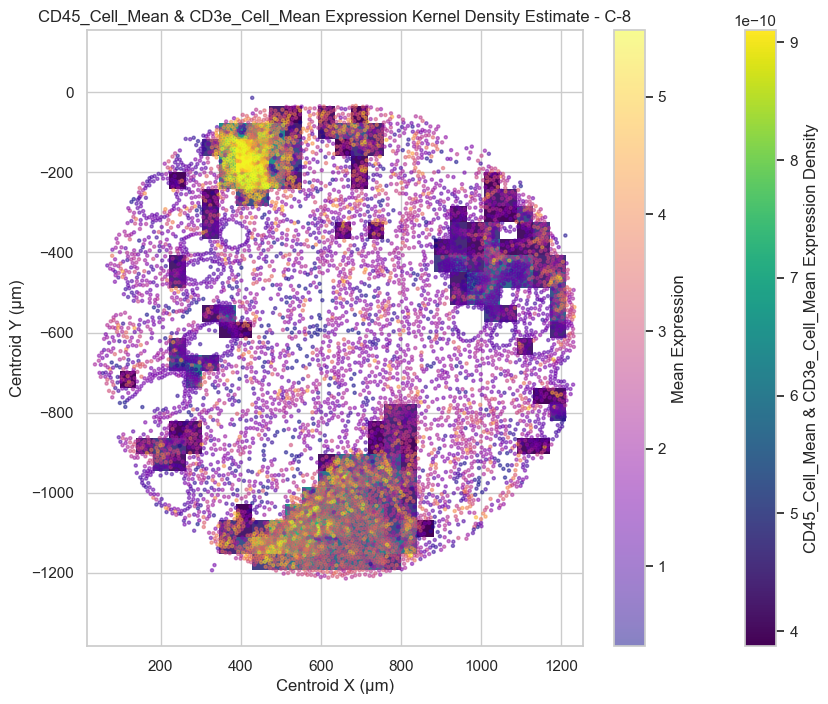

In [577]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity

# Define variables and core
vars = ["CD45_Cell_Mean", "CD3e_Cell_Mean"]
core = 'C-8'

# Extract data for the specified core
sset = adata[adata.obs['core'] == core]

# Get the indices of CD45 and CD3e in var names
feature_idxs = [np.where(adata.var_names == var)[0][0] for var in vars]

# Extract coordinates
x = sset.obs['Centroid.X.um'].values
y = -1 * sset.obs['Centroid.Y.um'].values

# Extract expression values
exprs = sset.layers['log_data'][:, feature_idxs]

# Combine coordinates and expressions
coords_exprs = np.column_stack([x, y, exprs])

# Fit the kernel density model
kde = KernelDensity(bandwidth=20, kernel='gaussian')
kde.fit(coords_exprs)

# Create a grid for density estimation
x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                             np.linspace(y.min(), y.max(), 30))
xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

# Estimate the density on the grid
z = np.exp(kde.score_samples(np.column_stack([xy_grid, np.zeros((xy_grid.shape[0], 2))])))
z = z.reshape(x_grid.shape)

# Create a mask based on a density threshold
density_threshold = np.percentile(z, 80)  # Adjust this value to change the masking level
mask = z > density_threshold

# Calculate combined expression for coloring
combined_expr = np.mean(exprs, axis=1)

# Plot
plt.figure(figsize=(10, 8))
plt.pcolormesh(x_grid, y_grid, np.where(mask, z, np.nan), shading='auto', cmap='viridis')
plt.colorbar(label=f'{" & ".join(vars)} Expression Density')
scatter = plt.scatter(x, y, c=combined_expr, s=5, cmap='plasma', alpha=0.5)
plt.colorbar(scatter, label='Mean Expression')
plt.xlabel('Centroid X (µm)')
plt.ylabel('Centroid Y (µm)')
plt.title(f'{" & ".join(vars)} Expression Kernel Density Estimate - {core}')
plt.axis('equal')
plt.show()


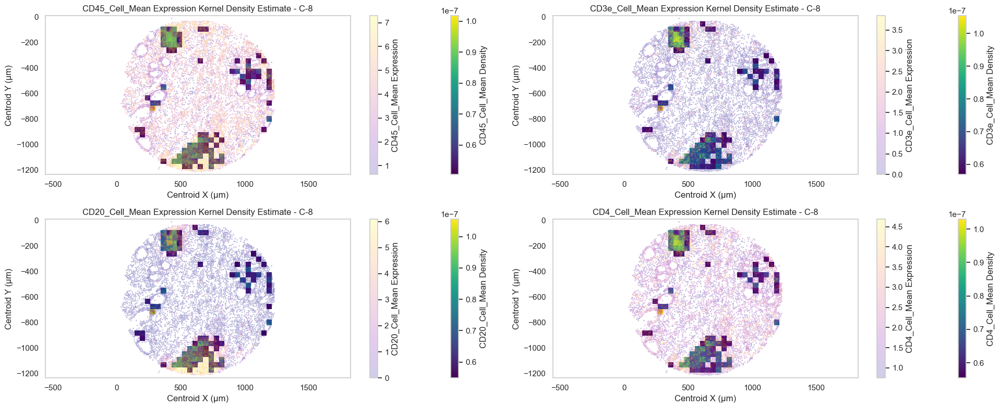

In [625]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity

# Define variables and core
vars = ["CD45_Cell_Mean", "CD3e_Cell_Mean", "CD20_Cell_Mean", "CD4_Cell_Mean"]
core = 'C-8'

# Extract data for the specified core
sset = adata[adata.obs['core'] == core]

# Get the indices of CD45 and CD3e in var names
feature_idxs = [np.where(adata.var_names == var)[0][0] for var in vars]

# Extract coordinates
x = sset.obs['Centroid.X.um'].values
y = -1 * sset.obs['Centroid.Y.um'].values

# Extract expression values
exprs = sset.layers['log_data'][:, feature_idxs]

# Create a figure with two subplots side by side
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(20, 8))

for i, (ax, var) in enumerate(zip([ax1, ax2, ax3, ax4], vars)):
    # Combine coordinates and expression for the current variable
    coords_expr = np.column_stack([x, y, exprs[:, i]])

    # Fit the kernel density model
    kde = KernelDensity(bandwidth=10, kernel='gaussian')
    kde.fit(coords_expr)

    # Create a grid for density estimation
    x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                                 np.linspace(y.min(), y.max(), 30))
    xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

    # Estimate the density on the grid
    z = np.exp(kde.score_samples(np.column_stack([xy_grid, np.zeros(xy_grid.shape[0])])))
    z = z.reshape(x_grid.shape)

    # Create a mask based on a density threshold
    density_threshold = np.percentile(z, 90)  # Adjust this value to change the masking level
    mask = z > density_threshold

    # Plot
    im = ax.pcolormesh(x_grid, y_grid, np.where(mask, z, np.nan), shading='auto', cmap='viridis')
    scatter = ax.scatter(x, y, c=exprs[:, i], s=1, cmap='plasma', alpha=0.2)
    
    fig.colorbar(im, ax=ax, label=f'{var} Density')
    fig.colorbar(scatter, ax=ax, label=f'{var} Expression')
    
    ax.set_xlabel('Centroid X (µm)')
    ax.set_ylabel('Centroid Y (µm)')
    ax.set_title(f'{var} Expression Kernel Density Estimate - {core}')
    ax.axis('equal')
    ax.grid(False)

plt.tight_layout()
plt.show()


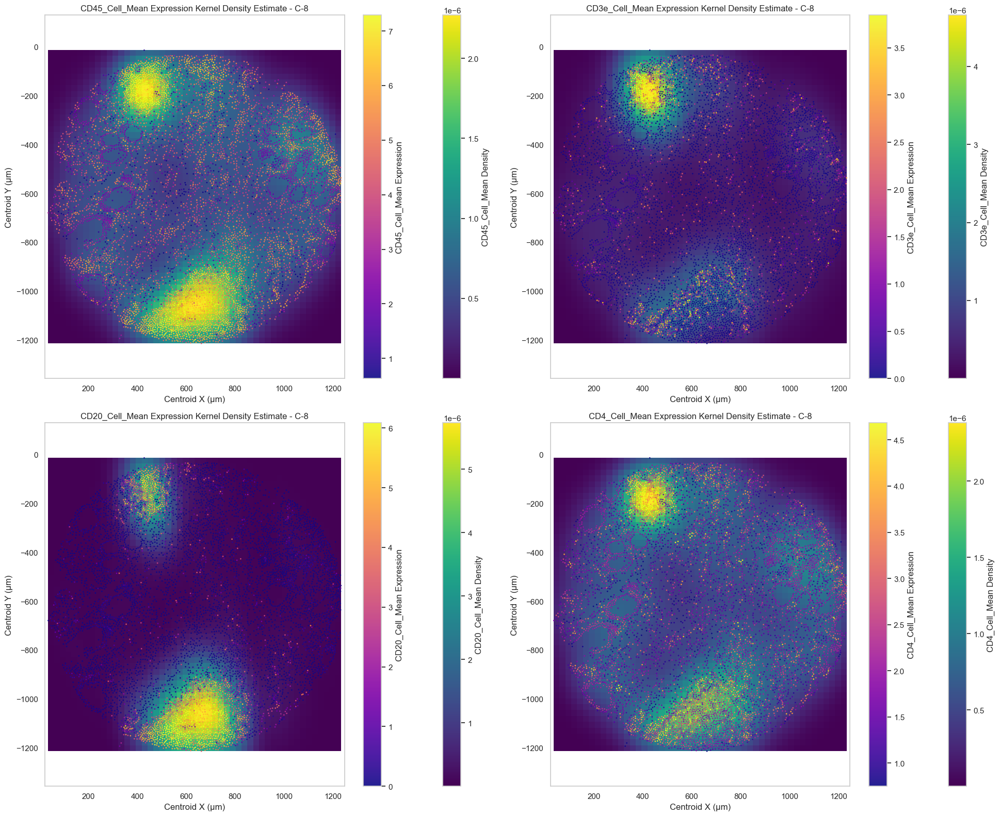

In [635]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Define variables and core
vars = ["CD45_Cell_Mean", "CD3e_Cell_Mean", "CD20_Cell_Mean", "CD4_Cell_Mean"]
core = 'C-8'

# Extract data for the specified core
sset = adata[adata.obs['core'] == core]

# Get the indices of variables in var names
feature_idxs = [np.where(adata.var_names == var)[0][0] for var in vars]

# Extract coordinates
x = sset.obs['Centroid.X.um'].values
y = -1 * sset.obs['Centroid.Y.um'].values

# Extract expression values
exprs = sset.layers['log_data'][:, feature_idxs]

# Create a figure with two subplots side by side
fig, axs = plt.subplots(2, 2, figsize=(20, 16))
axs = axs.ravel()

for i, (ax, var) in enumerate(zip(axs, vars)):
    # Create a grid for density estimation
    x_grid = np.linspace(x.min(), x.max(), 50)
    y_grid = np.linspace(y.min(), y.max(), 50)
    xx, yy = np.meshgrid(x_grid, y_grid)
    positions = np.vstack([xx.ravel(), yy.ravel()])

    # Create a single kernel for all points
    kernel = gaussian_kde(np.vstack([x, y]), weights=exprs[:, i])

    # Evaluate the kernel density estimate
    f = np.reshape(kernel(positions), xx.shape)

    # Plot the kernel density estimate
    #im = ax.imshow(np.rot90(f), cmap='viridis', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto')
    im = ax.imshow(f, cmap='viridis', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto', origin='lower')

    fig.colorbar(im, ax=ax, label=f'{var} Density')

    # Plot scatter of actual data points
    scatter = ax.scatter(x, y, c=exprs[:, i], s=1, cmap='plasma', alpha=0.9)
    fig.colorbar(scatter, ax=ax, label=f'{var} Expression')
    
    ax.set_xlabel('Centroid X (µm)')
    ax.set_ylabel('Centroid Y (µm)')
    ax.set_title(f'{var} Expression Kernel Density Estimate - {core}')
    ax.axis('equal')
    ax.grid(False)

plt.tight_layout()
plt.show()


In [636]:
os.getcwd()

'P:\\Lab_Members\\Josh\\cedars_analysis\\phenocycler_qupath\\codex_scanpy'

In [640]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity
from matplotlib.backends.backend_pdf import PdfPages

# Define variables
vars = ["CD45_Cell_Mean", "CD3e_Cell_Mean", "CD20_Cell_Mean", "CD4_Cell_Mean"]

# Get unique cores
unique_cores = adata.obs['core'].unique()
# unique_cores = ['B-11', 'B-12']

# Create a PdfPages object
with PdfPages('kernel_density_plots.pdf') as pdf:
    for core in unique_cores:
        print(core)
        # Extract data for the specified core
        sset = adata[adata.obs['core'] == core]

        # Get the indices of variables in var names
        feature_idxs = [np.where(adata.var_names == var)[0][0] for var in vars]

        # Extract coordinates
        x = sset.obs['Centroid.X.um'].values
        y = -1 * sset.obs['Centroid.Y.um'].values

        # Extract expression values
        exprs = sset.layers['log_data'][:, feature_idxs]

        # Create a figure with two subplots side by side
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(15, 12))

        for i, (ax, var) in enumerate(zip([ax1, ax2, ax3, ax4], vars)):
            # Combine coordinates and expression for the current variable
            coords_expr = np.column_stack([x, y, exprs[:, i]])

            # Fit the kernel density model
            kde = KernelDensity(bandwidth=10, kernel='gaussian')
            kde.fit(coords_expr)

            # Create a grid for density estimation
            x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                                         np.linspace(y.min(), y.max(), 30))
            xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

            # Estimate the density on the grid
            z = np.exp(kde.score_samples(np.column_stack([xy_grid, np.zeros(xy_grid.shape[0])])))
            z = z.reshape(x_grid.shape)

            # Create a mask based on a density threshold
            density_threshold = np.percentile(z, 90)  # Adjust this value to change the masking level
            mask = z > density_threshold

            # Plot
            im = ax.pcolormesh(x_grid, y_grid, np.where(mask, z, np.nan), shading='auto', cmap='viridis')
            scatter = ax.scatter(x, y, c=exprs[:, i], s=1, cmap='plasma', alpha=0.2)
            
            fig.colorbar(im, ax=ax, label=f'{var} Density')
            fig.colorbar(scatter, ax=ax, label=f'{var} Expression')
            
            ax.set_xlabel('Centroid X (µm)')
            ax.set_ylabel('Centroid Y (µm)')
            ax.set_title(f'{var} Expression Kernel Density Estimate - {core}')
            ax.axis('equal')
            ax.grid(False)

        plt.tight_layout()
        
        # Add the current figure to the PDF
        pdf.savefig(fig)
        plt.close(fig)

print("PDF saved successfully.")


B-11
B-12
B-3
B-4
B-5
B-6
B-7
B-8
B-9
C-11
C-12
C-3
C-4
C-6
C-7
C-8
C-9
D-10
D-11
D-12
D-3
D-4
D-5
D-6
D-7
D-8
D-9
E-10
E-11
E-12
E-3
E-5
E-6
E-9
F-11
F-12
F-4
F-5
F-6
F-7
F-8
F-9
G-12
G-7
G-8
H-10
H-11
H-12
H-4
H-5
H-6
H-7
H-8
H-9
I-10
I-12
I-5
I-6
I-7
I-8
I-9
J-10
J-11
J-12
J-5
J-7
J-8
J-9
K-7
K-8
K-9
M-1
M-10
M-11
M-12
M-2
M-3
M-4
M-5
M-6
M-7
M-8
M-9
N-10
N-11
N-12
N-2
N-3
N-5
N-6
N-7
N-8
N-9
O-1
O-10
O-11
O-12
O-2
O-4
O-5
O-6
O-7
O-8
O-9
P-10
P-11
P-2
P-4
P-6
P-7
P-9
Q-10
Q-11
Q-12
Q-2
Q-3
Q-4
Q-5
Q-6
Q-7
Q-8
Q-9
R-10
R-11
R-3
R-4
R-6
R-7
R-9
S-10
S-11
S-2
S-3
S-4
S-5
S-6
S-7
S-8
S-9
PDF saved successfully.


In [758]:
adata.obs['core'].value_counts()

core
N-10    21788
M-8     17588
N-8     17242
M-10    14365
N-12    14242
        ...  
S-3      1156
H-4      1141
B-6      1113
F-12      990
D-7       172
Name: count, Length: 139, dtype: int64

In [791]:
core = 'N-12'
clust = 'immune_15'

temp_file = adata.obs[(adata.obs['core'] == core) & (adata.obs['clustering'] == clust)]['Object.ID']
temp_file = pd.DataFrame(temp_file)
temp_file

,Object.ID
486232,025b7266-5dad-4327-8f4c-08db6a078b04
486237,0277d712-dd43-4bfb-a597-d1ed01eb879f
486349,04b17bd3-a1d3-4b93-a863-81ce6fb52ab3
486377,052d34d3-cc11-40cf-bb4f-e9239d8d78f4
486381,05340425-4e7d-4148-b40d-19b9a14d5854
...,...
500124,fbe54505-fefe-469b-b7fe-85b55e27c502
500135,fc16b4f4-70e0-4682-8a11-2cf8d1c42522
500157,fc92e6e2-7d97-4af6-acae-4d187e39bb00
500166,fcc8a124-6788-47c1-8fe4-ba7e529d16d2


In [792]:
temp_file.to_csv('temp_ids.csv', header = True, index = False)

In [745]:
os.listdir()

['.ipynb_checkpoints',
 'codex_analysis.ipynb',
 'codex_analysis_postqc.ipynb',
 'codex_analysis_postqc_epi_stroma.ipynb',
 'codex_analysis_postqc_immune.ipynb',
 'codex_functions.py',
 'data_for_presentation.csv',
 'immune_subset.ipynb',
 'immune_subset_reduced_features.ipynb',
 'kernel_density_plots.pdf',
 'neighborhood_freqs.ipynb',
 'Screenshot 2024-09-13 124012.png',
 'temp_ids.txt',
 '__pycache__']